# Song Generation: Neural Style Transfer for audio

With the use of convolutional neural networks (CNNs), we saw a vast rise in works involving style transfer to create a new image involving the content from one image and the style from a different image. In this project, we will be investigating applications and usage of CNNs in generating audios from random noise containing the content (i.e. tempo, melody) of one audio clip and the style of another audio (i.e. instrument types, pitch). The solution to this problem can potentially allow generation of new audio through the mixture of two completely different types of audio content.

## Import libraries

In [1]:
import sys
import numpy as np
import tensorflow as tf
import librosa
from pydub import AudioSegment
import os
from IPython.display import Audio, display
import matplotlib.pyplot as plt
from sys import stderr
%matplotlib inline

/Users/williampark73/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Hyperparameters

In [12]:
CONTENT_FILENAME = "inputs/bensound-ukulele"
STYLE_FILENAME = "inputs/fire"
OUTPUT_FILENAME = "out_ukelele_fire"
extension = ".mp3" #".wav" #in case browser does not play .wav e.g. mozilla firefox
FFT_WINDOW_SIZE = 2048 #default n_fft in librosa 
HOP_LENGTH = int(FFT_WINDOW_SIZE/4) #default -- change this to regulate output length for fixed n_fft
N_CHANNELS = int(FFT_WINDOW_SIZE/2)+1#non-tunable
N_SAMPLES = 400 #clip length of y axis of spectograms in case they are longer
#N_FILTERS = 4096 #number of filters for first and only CONV layer
N_FILTER_LIST = [128, 256, 512, 1024, 2048, 4096]
FILTER_WIDTH = 11
TESTRESULTS = []
#optimization
ALPHA= 0.006 #loss = alpha*content + beta*style
BETA = 1
learning_rate= 1e-3
iterations = 50 #max iterations per epoch
EPOCHS = 3

## Functions

In [5]:
def load_audio(path):
    display(Audio(path + extension))

In [6]:
def write_audio(result ,example ,output_path):
    a = np.zeros(example.shape)
    a[:N_CHANNELS,:] = np.exp(result[0,0].T) - 1

    # This code is supposed to do phase reconstruction
    p = 2 * np.pi * np.random.random_sample(a.shape) - np.pi
    #for i in range(500):
    S = a * np.exp(1j*p)
    x = librosa.istft(S, hop_length = HOP_LENGTH)

    librosa.output.write_wav(output_path + ".wav" , x, fs)
    if extension == ".mp3":
        AudioSegment.from_wav(output_path + ".wav").export(output_path + extension, format=extension[1:])
        os.remove(output_path + ".wav")

In [7]:
# Reads wav file and produces spectrum
def convert_audio_to_spectogram(filename):
    x, fs = librosa.load(filename + extension) #fs is the sampling rate of the filename audio
    S = librosa.stft(x, n_fft=FFT_WINDOW_SIZE, hop_length=HOP_LENGTH)
    S = np.log1p(np.abs(S[:,:]))  #extracts the maginitude of frequency (rows) i at frame (column) j
    return S,fs

In [8]:
# Change Style shape to match Content Shape
# Change both shapes to have columns = min(CLIP_SIZE, N_SAMPLES) and rows = N_SAMPLES
def match_shapes(a_content, a_style, clip):
    CONTENT_SAMPLES = a_content.shape[1]
    CONTENT_CHANNELS = a_content.shape[0]
    STYLE_SAMPLES = a_style.shape[1]
    STYLE_CHANNELS = a_style.shape[0]
    
    if CONTENT_SAMPLES >= STYLE_SAMPLES :
        a_style = a_style[:CONTENT_CHANNELS, :CONTENT_SAMPLES]
    else:
        a_content = a_content[:STYLE_CHANNELS, :STYLE_SAMPLES]
    N_SAMPLES = a_content.shape[1]
    N_CHANNELS = a_content.shape[0]
    if clip < N_SAMPLES:
        a_style = a_style[:N_CHANNELS, :clip]
        a_content = a_content[:N_CHANNELS, :clip]
    return a_style, a_content

In [9]:
def plot_spectogram(images_list):
    Y_AXIS_TRIM = 400
    X_AXIS_TRIM = 400
    IMG_WIDTH = 10
    IMG_HEIGHT = 10
    plt.figure(figsize=(IMG_WIDTH, IMG_HEIGHT))
    for i in range(len(images_list)):
        plt.subplot(1, len(images_list), i+1)
        plt.title(images_list[i]["name"])
        plt.imshow(images_list[i]["data"][:Y_AXIS_TRIM,:X_AXIS_TRIM])
    plt.show()

In [10]:
step=0;
def step_handler_callback(interim_result, step, output_path = 'outputs/out'+str(step)):
    write_audio(interim_result , a_content,output_path)
    a_result, fs2 = convert_audio_to_spectogram(output_path) 
    load_audio(output_path)
    plot_spectogram([{"name":"Content","data": a_content},{"name":"Style","data": a_style},{"name":"Result","data": interim_result[0,0,:,:]}])

### Load style and content

In [11]:
print("Content File::")
load_audio(CONTENT_FILENAME)

print("Style File::")
load_audio(STYLE_FILENAME)

Content File::


Style File::


### Convert Audio to Spectogram

before resizing:: (1025, 433) (1025, 6305)
after resizing:: (1025, 400) (1025, 400)


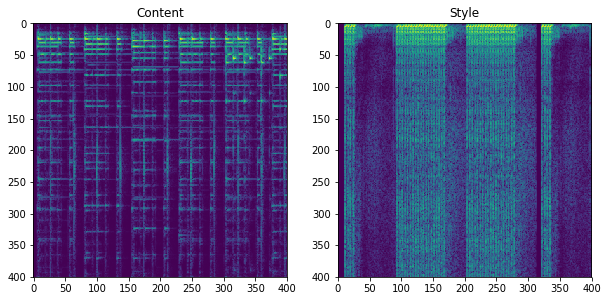

In [12]:
a_content,fs = convert_audio_to_spectogram(CONTENT_FILENAME)
a_style, fs = convert_audio_to_spectogram(STYLE_FILENAME) #rows=(nfft+1)/2, columns=(time_frames - nfft)/(hop_length)+ 5
print("before resizing::", a_style.shape , a_content.shape) 
a_style, a_content = match_shapes(a_content, a_style, N_SAMPLES)
print("after resizing::", a_style.shape , a_content.shape)
N_SAMPLES = a_style.shape[1]
plot_spectogram([{"name":"Content","data": a_content},{"name":"Style","data": a_style}])

## Neural Net 

##################################################
Test # 1
Number of filters:  128
===
content shape (1, 1, 390, 128)
style shape (128, 128)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 867.109253
  Number of iterations: 50
  Number of functions evaluations: 62
i: 0 Interim loss: 867.10925


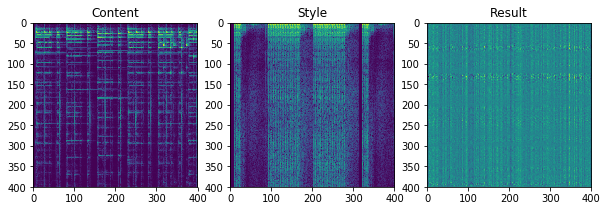

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 821.866516
  Number of iterations: 50
  Number of functions evaluations: 53
i: 1 Interim loss: 821.8665


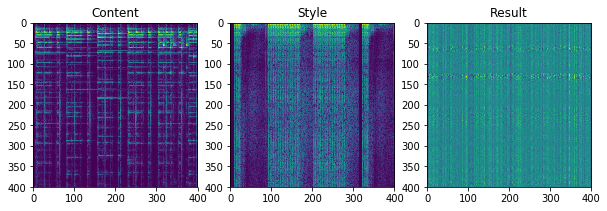

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 808.795776
  Number of iterations: 50
  Number of functions evaluations: 53
i: 2 Interim loss: 808.7958


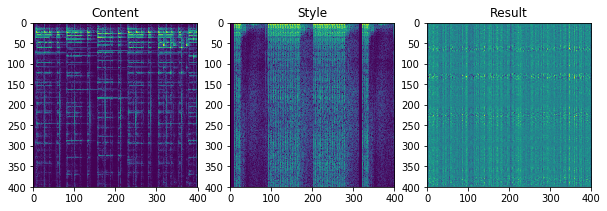

Final loss: 808.7958
Final result: [[[[ 0.07661364  0.02698351  0.02669564 ... -0.10880905 -0.12604865
     0.06157394]
   [ 0.29435623  0.12415663  0.05399767 ... -0.03603083 -0.18173513
    -0.08052322]
   [ 0.16461632 -0.05253348  0.11936253 ... -0.22909918  0.06505372
    -0.18060483]
   ...
   [ 0.26408926 -0.20622003 -0.15688445 ...  0.15508997  0.3842917
    -0.58030826]
   [ 0.07752703 -0.04468596 -0.22723316 ...  0.12888466  0.3302113
    -0.252021  ]
   [-0.03932779 -0.13038376 -0.24206734 ... -0.06006773  0.12204881
    -0.10934767]]]]
##################################################
Test # 2
Number of filters:  256
===
content shape (1, 1, 390, 256)
style shape (256, 256)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 1566.515137
  Number of iterations: 50
  Number of functions evaluations: 59
i: 0 Interim loss: 1566.5151


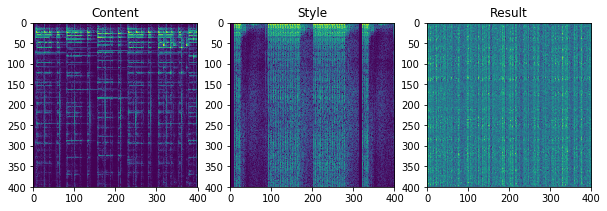

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 1425.809204
  Number of iterations: 50
  Number of functions evaluations: 54
i: 1 Interim loss: 1425.8092


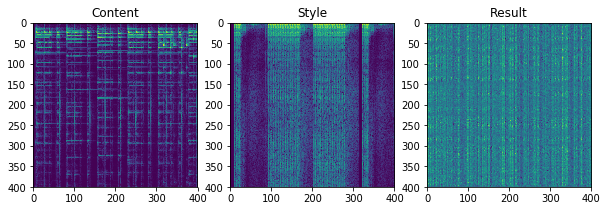

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 1388.238037
  Number of iterations: 50
  Number of functions evaluations: 53
i: 2 Interim loss: 1388.238


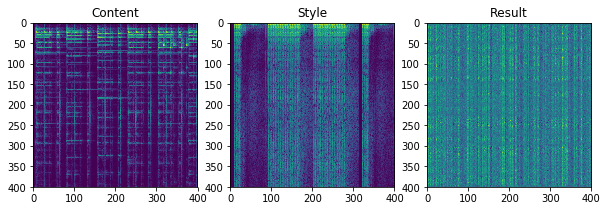

Final loss: 1388.238
Final result: [[[[-0.09421314  0.10012677  0.15452625 ... -0.4838064   0.08221882
     0.33320248]
   [ 0.03632517 -0.05806652 -0.23373422 ... -0.07336059 -0.13222961
     0.16215205]
   [-0.03676007  0.47352734  0.18391088 ... -0.05096993  0.12744586
     0.49031064]
   ...
   [ 0.29398456  0.2660324   0.6762534  ... -0.27950975 -0.6930339
     0.26276407]
   [ 0.28386468  0.12041584  0.41959822 ... -0.368842   -0.05705935
     0.17314987]
   [ 0.36600786  0.15573256  0.33114487 ... -0.29400888 -0.20720606
     0.23408927]]]]
##################################################
Test # 3
Number of filters:  512
===
content shape (1, 1, 390, 512)
style shape (512, 512)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 2855.094727
  Number of iterations: 50
  Number of functions evaluations: 62
i: 0 Interim loss: 2855.0947


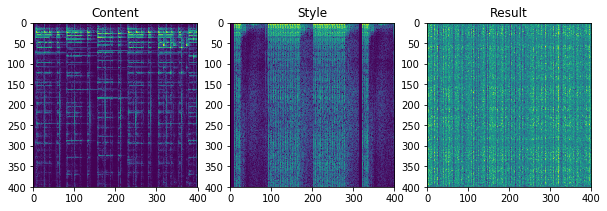

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 2540.315918
  Number of iterations: 50
  Number of functions evaluations: 53
i: 1 Interim loss: 2540.316


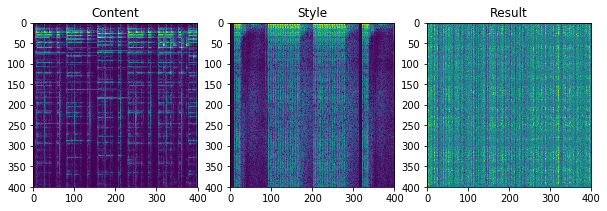

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 2455.812744
  Number of iterations: 50
  Number of functions evaluations: 54
i: 2 Interim loss: 2455.8127


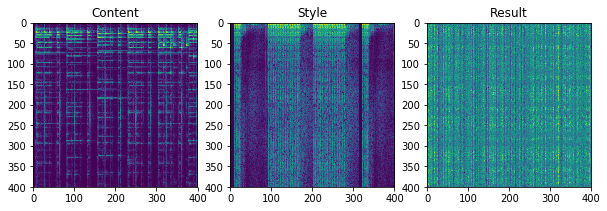

Final loss: 2455.8127
Final result: [[[[ 4.52283174e-02  3.23024631e-01  1.23565905e-01 ... -2.36710440e-02
    -3.24488990e-02 -1.27046302e-01]
   [ 1.06931590e-01  2.34519988e-01 -6.44374033e-03 ... -6.09040856e-02
     4.58013713e-01 -4.24259866e-04]
   [ 2.36052752e-01 -2.77133025e-02  2.39325792e-01 ... -7.21189231e-02
    -4.11943765e-03 -8.41549456e-01]
   ...
   [ 2.89357025e-02 -2.03237966e-01  2.66219795e-01 ...  7.96417892e-02
    -1.03247786e+00 -2.43111596e-01]
   [ 6.00767016e-01 -2.71926939e-01  7.24810481e-01 ...  4.07506479e-03
    -8.47749591e-01  2.29588509e-01]
   [ 6.01879001e-01  3.87528330e-01  8.13581049e-01 ...  4.04760450e-01
    -6.82203829e-01  1.04153246e-01]]]]
##################################################
Test # 4
Number of filters:  1024
===
content shape (1, 1, 390, 1024)
style shape (1024, 1024)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 

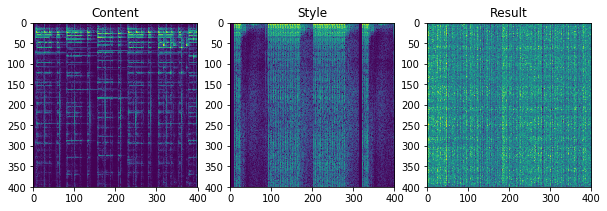

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 3110.411865
  Number of iterations: 50
  Number of functions evaluations: 52
i: 1 Interim loss: 3110.4119


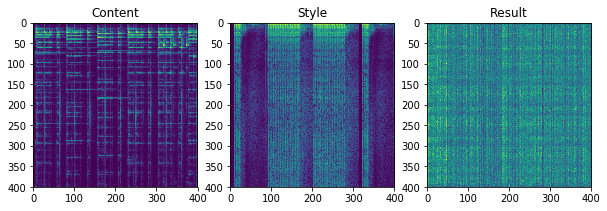

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 2932.423584
  Number of iterations: 50
  Number of functions evaluations: 55
i: 2 Interim loss: 2932.4236


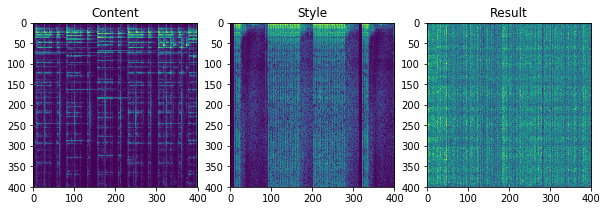

Final loss: 2932.4236
Final result: [[[[-0.16481964  0.55387723  0.31135944 ...  0.78711146 -0.10494784
     0.4709023 ]
   [-0.97466344  0.31551093  0.30788773 ...  0.24185458 -0.5444762
     0.6047947 ]
   [-0.1532028   0.3956082   0.5734668  ... -0.76833326  0.9595096
     0.74295944]
   ...
   [ 2.1965816   1.2602932  -0.01326464 ... -0.715377   -0.4195167
    -0.40709463]
   [ 0.4196199   0.9573091  -0.7802568  ... -0.3771055  -0.6530282
    -0.11051333]
   [ 0.30708334  1.1776782  -0.23096287 ...  0.9973648   0.07380255
     0.12371709]]]]
##################################################
Test # 5
Number of filters:  2048
===
content shape (1, 1, 390, 2048)
style shape (2048, 2048)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 5281.203613
  Number of iterations: 50
  Number of functions evaluations: 62
i: 0 Interim loss: 5281.2036


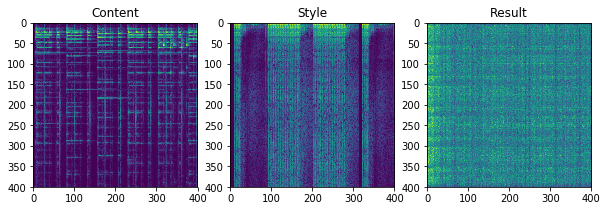

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 4136.088379
  Number of iterations: 50
  Number of functions evaluations: 51
i: 1 Interim loss: 4136.0884


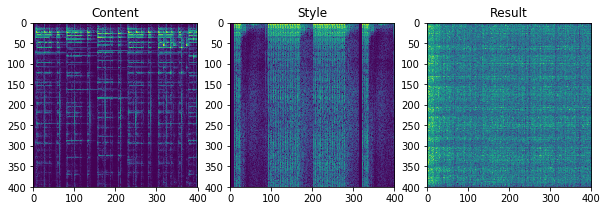

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 3813.052734
  Number of iterations: 50
  Number of functions evaluations: 53
i: 2 Interim loss: 3813.0527


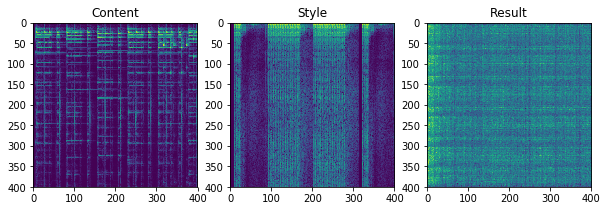

Final loss: 3813.0527
Final result: [[[[-0.0440304   0.3141188  -0.32480597 ... -0.28136596  0.15079266
    -0.15832104]
   [ 1.2419178  -0.14798662 -0.05664486 ... -0.726868   -0.6814875
    -0.4092118 ]
   [ 0.41237167 -0.9650675  -0.03274227 ... -1.7379621  -0.75750375
    -1.031092  ]
   ...
   [-0.68990344  2.5189157   0.23709035 ... -0.2378691  -0.59765095
     0.13158911]
   [ 0.7774103   2.1704462  -0.28440753 ... -0.7852016  -0.24266933
     0.69472677]
   [-0.01558395  0.6414556  -0.5372361  ...  0.56839323  0.28029105
     0.5802175 ]]]]
##################################################
Test # 6
Number of filters:  4096
===
content shape (1, 1, 390, 4096)
style shape (4096, 4096)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 5604.902344
  Number of iterations: 50
  Number of functions evaluations: 62
i: 0 Interim loss: 5604.9023


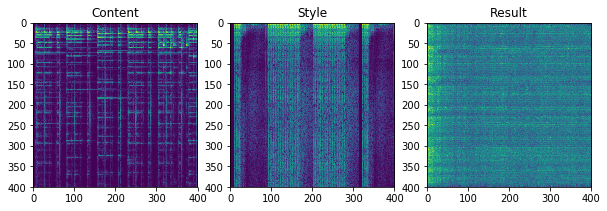

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 4519.975586
  Number of iterations: 50
  Number of functions evaluations: 54
i: 1 Interim loss: 4519.9756


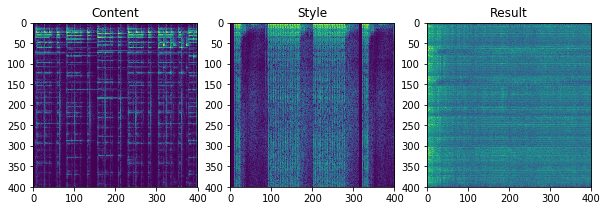

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 4285.384277
  Number of iterations: 50
  Number of functions evaluations: 53
i: 2 Interim loss: 4285.3843


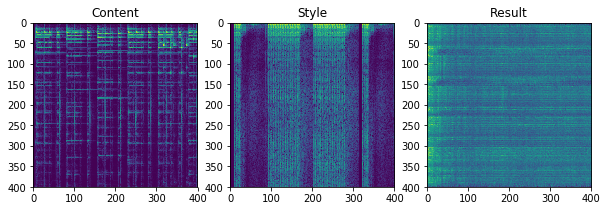

Final loss: 4285.3843
Final result: [[[[ 0.46617326  0.1820733   0.32888222 ...  0.5545226   0.40872696
     0.3295168 ]
   [ 0.03935644  0.32241392  0.8220417  ...  0.38152322 -0.49583423
     0.03205428]
   [-0.30265573  0.39992866  0.10442739 ...  0.2335606   0.6319535
    -0.24536991]
   ...
   [-0.41810346 -0.02825491  1.5722342  ...  0.27171668 -0.7301063
    -0.43378568]
   [ 0.44252324 -0.2646598   1.0261118  ...  0.15328883 -0.6084283
     0.39172873]
   [ 0.04082486 -0.63975054  0.98926884 ...  0.2473424  -0.09069685
     0.34822795]]]]


In [21]:
for i, N_FILTERS in enumerate(N_FILTER_LIST):
    print("##################################################")
    print("Test #", i+1)
    print("Number of filters: ", N_FILTERS)
    print("===")
    a_content_tf = np.ascontiguousarray(a_content.T[None,None,:,:])#1x1x1025x400
    a_style_tf = np.ascontiguousarray(a_style.T[None,None,:,:])

    # filter shape is [filter_height, filter_width, in_channels, out_channels]
    std = np.sqrt(2) * np.sqrt(2.0 / ((N_CHANNELS + N_FILTERS) * FILTER_WIDTH))
    filterr = np.random.randn(1, FILTER_WIDTH, N_CHANNELS, N_FILTERS)*std

    g = tf.Graph()
    with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:

        filter_tf = tf.constant(filterr, name="filter", dtype='float32')

        # data shape is "[batch, in_height, in_width, in_channels]",
        x_CS = tf.placeholder('float32', [1,1,N_SAMPLES,N_CHANNELS], name="x_CS")
        conv_CS = tf.nn.conv2d(x_CS,filter_tf,strides=[1, 1, 1, 1],padding="VALID",name="conv_CS")
        net_CS = tf.nn.relu(conv_CS)

        #extracting content
        content_features = net_CS.eval(feed_dict={x_CS: a_content_tf})
        print('content shape', content_features.shape)

        #extracting style
        style_features = net_CS.eval(feed_dict={x_CS: a_style_tf})
        features = np.reshape(style_features, (-1, N_FILTERS))
        style_gram = np.matmul(features.T, features) / N_SAMPLES
        print('style shape', style_gram.shape)

    with tf.Graph().as_default():
        filter_tf = tf.constant(filterr, name="filter", dtype='float32')

        # variable input
        x = tf.Variable(np.random.randn(1,1,N_SAMPLES,N_CHANNELS).astype(np.float32)*1e-3, name="x")
        conv = tf.nn.conv2d(x,filter_tf,strides=[1, 1, 1, 1],padding="VALID",name="conv")
        net = tf.nn.relu(conv)

        #optimize
        result = None
        interim_result = None

        ##content loss
        content_loss = 2 * tf.nn.l2_loss(net - content_features)

        ##style loss
        _, height, width, number = map(lambda i: i.value, net.get_shape())
        size = height * width * number
        feats = tf.reshape(net, (-1, number))
        gram = tf.matmul(tf.transpose(feats), feats)  / N_SAMPLES
        style_loss = 2 * tf.nn.l2_loss(gram - style_gram)

        ## Overall loss
        loss = ALPHA*content_loss + BETA*style_loss

        ##Optimization   
        opt = tf.contrib.opt.ScipyOptimizerInterface(loss, method='L-BFGS-B', options={'maxiter': iterations})    
        with tf.Session() as sess:
            sess.run(tf.global_variables_initializer())
            print('Started optimization:')
            for i in range(EPOCHS):
                opt.minimize(sess)
                print('i:' , i , 'Interim loss:', loss.eval())
                interim_result = x.eval()
                step_handler_callback(interim_result, i)

        ## result
            print ('Final loss:', loss.eval())
            result = x.eval()
            print('Final result:', result)
            
            TESTRESULTS.append(loss.eval())

## Comparison Plot - Number of Filters

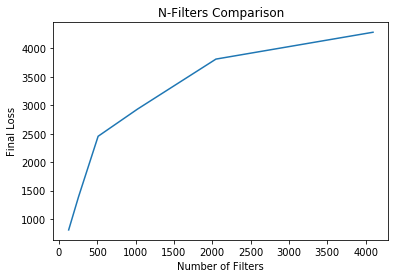

In [22]:
x = N_FILTERS_LIST
y = TESTRESULTS

plt.plot(x, y)
plt.title("N-Filters Comparison")
plt.xlabel("Number of Filters")
plt.ylabel("Final Loss")
plt.show()

## New Setup - Hyperparameters

In [18]:
# DO NOT WORRY ABOUT THIS. DO NOT TOUCH THIS
raise("STOP")
CONTENT_FILENAME = "inputs/bensound-ukulele"
STYLE_FILENAME = "inputs/fire"
OUTPUT_FILENAME = "out_ukelele_fire"
extension = ".mp3" #".wav" #in case browser does not play .wav e.g. mozilla firefox
FFT_WINDOW_SIZE = 2048 #default n_fft in librosa 
HOP_LENGTH = int(FFT_WINDOW_SIZE/4) #default -- change this to regulate output length for fixed n_fft
N_CHANNELS = int(FFT_WINDOW_SIZE/2)+1#non-tunable
N_SAMPLES = 400 #clip length of y axis of spectograms in case they are longer
#N_FILTERS = 4096 #number of filters for first and only CONV layer
N_FILTERS = 128
FILTER_WIDTH = 11
#optimization
ALPHA= 0.006 #loss = alpha*content + beta*style
BETA = 1
learning_rate= 1e-3
iterations = 50 #max iterations per epoch
EPOCHS = 3

TypeError: exceptions must derive from BaseException

content shape (1, 1, 390, 128)
style shape (128, 128)
Started optimization:
INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 834.619019
  Number of iterations: 50
  Number of functions evaluations: 62
i: 0 Interim loss: 834.619


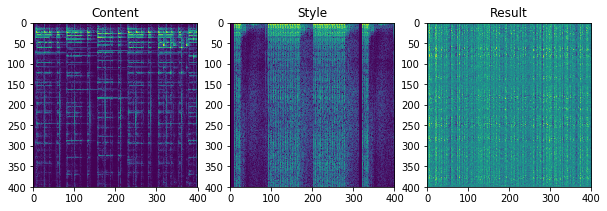

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 794.301697
  Number of iterations: 50
  Number of functions evaluations: 52
i: 1 Interim loss: 794.3017


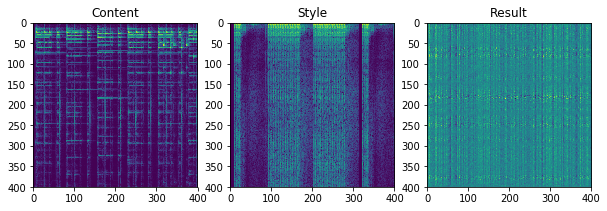

INFO:tensorflow:Optimization terminated with:
  Message: b'STOP: TOTAL NO. of ITERATIONS REACHED LIMIT'
  Objective function value: 787.183411
  Number of iterations: 50
  Number of functions evaluations: 53
i: 2 Interim loss: 787.1834


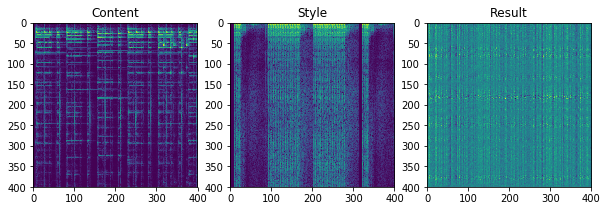

Final loss: 787.1834
Final result: [[[[ 0.08866598  0.03382561  0.07232729 ...  0.04438778 -0.05866156
     0.12618805]
   [-0.09404789  0.01546504  0.13141103 ...  0.28006098 -0.04816977
    -0.15029262]
   [-0.08677841  0.1713318   0.14997725 ...  0.3128654  -0.06551084
     0.07040786]
   ...
   [-0.2923535   0.59326965 -0.10615066 ... -0.11183575  0.18401308
     0.365177  ]
   [-0.13193902  0.2341088  -0.03317416 ... -0.06989177  0.1803118
     0.03334785]
   [-0.20759079  0.08192308 -0.09797567 ...  0.0491276  -0.07307519
     0.15503825]]]]


In [16]:
# DO NOT WORRY ABOUT THIS. DO NOT TOUCH THIS
raise("STOP")
a_content_tf = np.ascontiguousarray(a_content.T[None,None,:,:])#1x1x1025x400
a_style_tf = np.ascontiguousarray(a_style.T[None,None,:,:])

# filter shape is [filter_height, filter_width, in_channels, out_channels]
std = np.sqrt(2) * np.sqrt(2.0 / ((N_CHANNELS + N_FILTERS) * FILTER_WIDTH))
filterr = np.random.randn(1, FILTER_WIDTH, N_CHANNELS, N_FILTERS)*std

g = tf.Graph()
with g.as_default(), g.device('/cpu:0'), tf.Session() as sess:

    filter_tf = tf.constant(filterr, name="filter", dtype='float32')

    # data shape is "[batch, in_height, in_width, in_channels]",
    x_CS = tf.placeholder('float32', [1,1,N_SAMPLES,N_CHANNELS], name="x_CS")
    conv_CS = tf.nn.conv2d(x_CS,filter_tf,strides=[1, 1, 1, 1],padding="VALID",name="conv_CS")
    net_CS = tf.nn.relu(conv_CS)

    #extracting content
    content_features = net_CS.eval(feed_dict={x_CS: a_content_tf})
    print('content shape', content_features.shape)

    #extracting style
    style_features = net_CS.eval(feed_dict={x_CS: a_style_tf})
    features = np.reshape(style_features, (-1, N_FILTERS))
    style_gram = np.matmul(features.T, features) / N_SAMPLES
    print('style shape', style_gram.shape)

with tf.Graph().as_default():
    filter_tf = tf.constant(filterr, name="filter", dtype='float32')

    # variable input
    x = tf.Variable(np.random.randn(1,1,N_SAMPLES,N_CHANNELS).astype(np.float32)*1e-3, name="x")
    conv = tf.nn.conv2d(x,filter_tf,strides=[1, 1, 1, 1],padding="VALID",name="conv")
    net = tf.nn.relu(conv)

    #optimize
    result = None
    interim_result = None

    ##content loss
    content_loss = 2 * tf.nn.l2_loss(net - content_features)

    ##style loss
    _, height, width, number = map(lambda i: i.value, net.get_shape())
    size = height * width * number
    feats = tf.reshape(net, (-1, number))
    gram = tf.matmul(tf.transpose(feats), feats)  / N_SAMPLES
    style_loss = 2 * tf.nn.l2_loss(gram - style_gram)

    ## Overall loss
    loss = ALPHA*content_loss + BETA*style_loss

    ##Optimization   
    opt = tf.contrib.opt.ScipyOptimizerInterface(loss, method='L-BFGS-B', options={'maxiter': iterations})    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        print('Started optimization:')
        for i in range(EPOCHS):
            opt.minimize(sess)
            print('i:' , i , 'Interim loss:', loss.eval())
            interim_result = x.eval()
            step_handler_callback(interim_result, i)

    ## result
        print ('Final loss:', loss.eval())
        result = x.eval()
        print('Final result:', result)

## Invert spectrogram and save the result

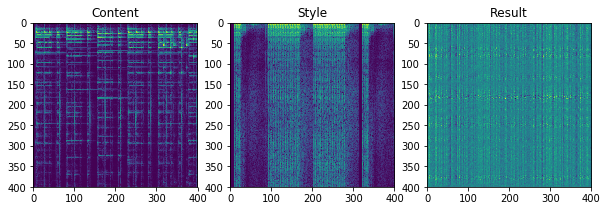

In [17]:
step_handler_callback(result, 47, output_path = OUTPUT_FILENAME)